# Visualising The Chicago Crime Data

To get a better understanding of the Chicago Crime Dataset it will be helpful to visualise the data.

In [25]:
import pandas as pd # Import Pandas

# Use the inline backend to generate the plots within the browser
#%matplotlib inline 

import matplotlib as mpl
import matplotlib.pyplot as plt

import seaborn as sns
sns.set_style("darkgrid")

font = {'size'   : 14}
mpl.rc('font', **font)

# Use Folium to display the Maps for Visualisation
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster
from folium import plugins

In [26]:
# Import the Pickle of the DataFrame
df_crimes = pd.read_pickle('./Pickles/crimes.pkl')

### Number of Crimes per month

Text(0.0, 1.0, 'Number of Cases Per Month')

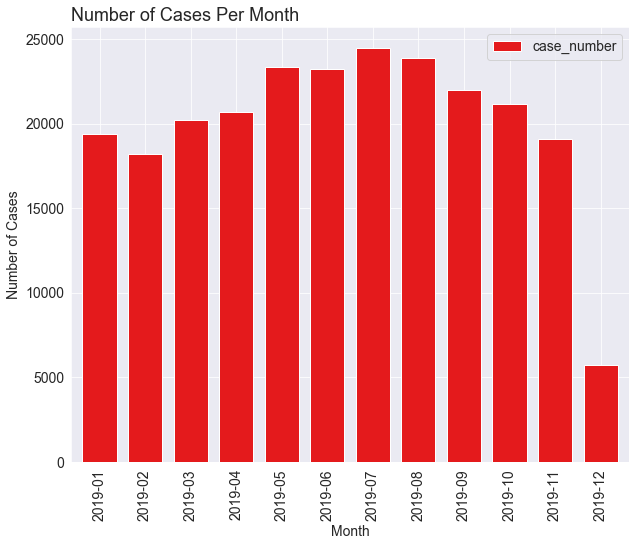

In [53]:
# Group the Crimes per month and produce a bar chart
df_crimes.groupby('year_month').count().plot(y = 'case_number', 
                                             kind='bar',
                                             figsize=(10,8),
                                             width=0.75,
                                             colormap='Set1')

plt.xlabel('Month')
plt.ylabel('Number of Cases')
plt.title('Number of Cases Per Month', loc='left', fontsize=18)

Unsuprisingly there little obvious variation in the number of crimes committed per month other than an apparent increase in july.

### Number of crimes occuring on each day

Text(0.0, 1.0, 'Number of Cases Per Day of Week')

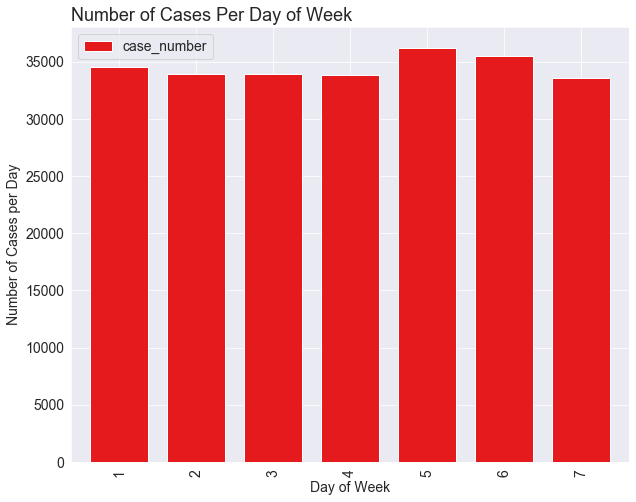

In [56]:
# Group the Crimes per day and produce a bar chart
df_crimes.groupby('day').count().plot(y = 'case_number',
                                      kind='bar',
                                      figsize=(10,8),
                                      width=0.75,
                                      colormap='Set1')
plt.xlabel('Day of Week')
plt.ylabel('Number of Cases per Day')
plt.title('Number of Cases Per Day of Week', loc='left', fontsize=18)

No significant change throught the week is observed

### Number of crimes occuring in each hour

Text(0.0, 1.0, 'Number of Cases Per Hour]')

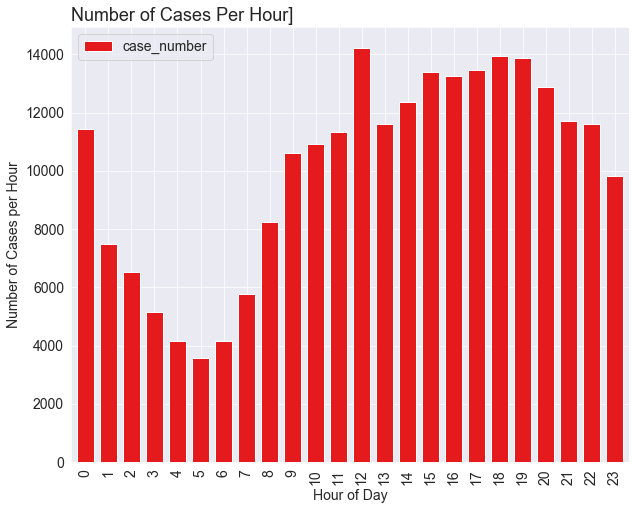

In [58]:
# Group the Crimes per hour and produce a bar chart
df_crimes.groupby('hour').count().plot(y = 'case_number',
                                       kind='bar',
                                       figsize=(10,8),
                                       width=0.75,
                                       colormap='Set1')

plt.xlabel('Hour of Day')
plt.ylabel('Number of Cases per Hour')
plt.title('Number of Cases Per Hour]', loc='left', fontsize=18)

There is an expected fall-off in reported crime rates after midnight before elevating again after eight in the morning. There appears to be a spike around midday.

### Now let's look at the Crime Categories.

In [60]:
df_crimes.primary_type.nunique() # Number of unique Crime categories bases on the Primary Description

31

In [67]:
# What are the 10 most commonly occuring crimes 

df_crimes[['primary_type', 'case_number']].groupby(['primary_type'], as_index=False).count().sort_values('case_number', ascending=False).head(10)

,primary_type,case_number
29,THEFT,57505
2,BATTERY,46674
6,CRIMINAL DAMAGE,25141
1,ASSAULT,19506
8,DECEPTIVE PRACTICE,16156
22,OTHER OFFENSE,15637
17,NARCOTICS,13186
3,BURGLARY,8965
16,MOTOR VEHICLE THEFT,8380
26,ROBBERY,7464


In [68]:
# Create a list of the 10 most commonly occuring crimes

top_ten_crimes = df_crimes[['primary_type', 'case_number']].groupby(['primary_type']).count().sort_values('case_number', ascending=False)[:10].axes[0].tolist()

In order to get a better understanding of the top ten crimes lets first create smaller dataframe the only contains these top crimes. Next we'll visualise these crimes using area charts.

Text(0.0, 1.0, 'Top 10 Cases Per Month')

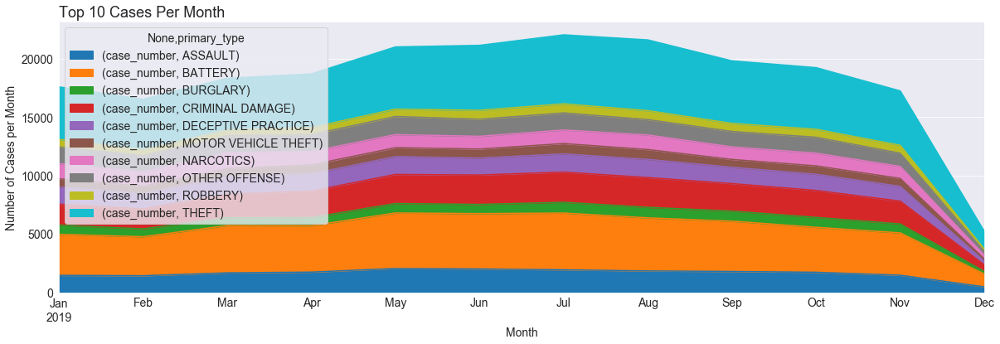

In [86]:
# Create a new data frame with just the top 10 crimes

df_top10_crimes = df_crimes[df_crimes['primary_type'].isin(top_ten_crimes)].copy()

# Create a pivot area chart of the crimes per month

df_top10_crimes[['case_number', 'primary_type', 'year_month']].pivot_table(
    index='year_month', 
    columns='primary_type', 
    fill_value=0, 
    aggfunc='count').plot(kind='area',
                          stacked=True,
                          figsize=(20, 6),
                          colormap='tab10')

plt.xlabel('Month')
plt.ylabel('Number of Cases per Month')
plt.title('Top 10 Cases Per Month', loc='left', fontsize=18)

It would appear that crimes peak in the Summer months and then fall off in Winter. 

Now look per day.

Text(0.0, 1.0, 'Top 10 Cases Per Day')

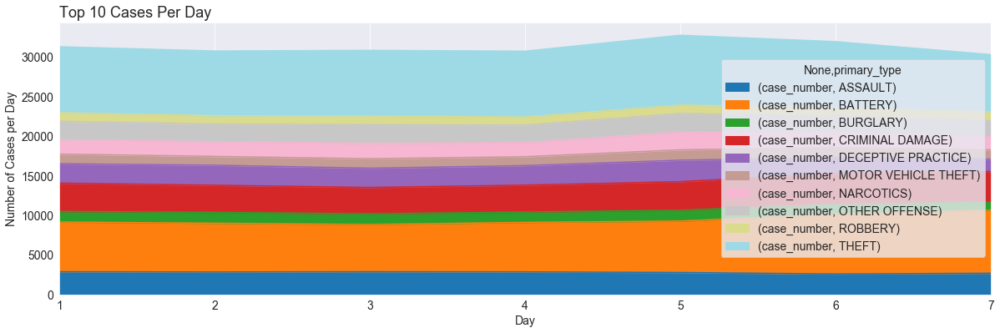

In [87]:
# Create a pivot area chart of the crimes per day

df_top10_crimes[['case_number', 'primary_type', 'day']].pivot_table(
    index='day', 
    columns='primary_type', 
    fill_value=0, 
    aggfunc='count').plot(kind='area',
                          stacked=True,
                          figsize=(20, 6),
                          colormap='tab20')

plt.xlabel('Day')
plt.ylabel('Number of Cases per Day')
plt.title('Top 10 Cases Per Day', loc='left', fontsize=18)

This chart suggests that Saturday, Sunday & Monday (Monday is Day 1) have more more crime but that this increase is driven by the crime of Theft.

 Finally lets look per hour.

Text(0.0, 1.0, 'Top 10 Cases Per Hour')

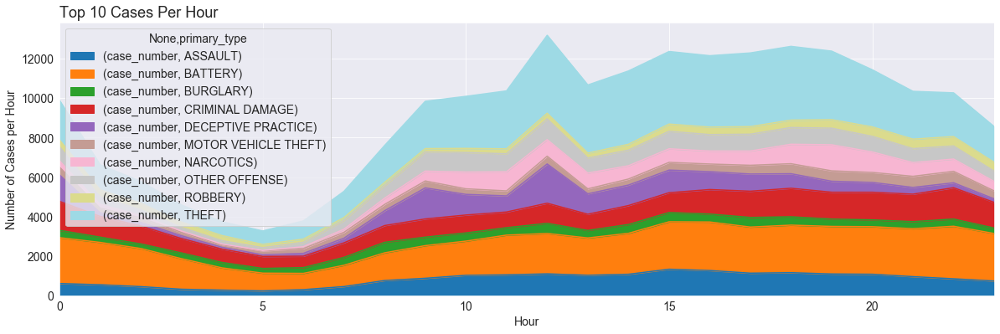

In [88]:
# Create a pivot area chart of the crimes per hour

df_top10_crimes[['case_number', 'primary_type', 'hour']].pivot_table(
    index='hour', 
    columns='primary_type', 
    fill_value=0, 
    aggfunc='count').plot(kind='area',
                          stacked=True,
                          figsize=(20, 6),
                          colormap='tab20')

plt.xlabel('Hour')
plt.ylabel('Number of Cases per Hour')
plt.title('Top 10 Cases Per Hour', loc='left', fontsize=18)

It would appear that 5:00 am in the morning is the safest time in Chicago whilst 12:00 pm in the afternoon is the most dangerous.

### Create a folium map with a different colour per crime

Colour each of the top 10 crimes with a different and plot on a Folium map.

In [89]:
# Create a list of 10 colours. 

colors10 = [
    'red',
    'blue',
    'gray',
    'orange',
    'beige',
    'green',
    'purple',
    'pink',
    'cadetblue',
    'black'
]

# Create a dictionary of colours to map to the crimes

dict_colours10 = dict(zip(top_ten_crimes, colors10))

The entire `df_top10_crimes` DataFrame contains too many point to disply effeciently using Folium. To combat this we will just use the data from November 2019.

In [90]:
# Add the colours colums to the df_top_crimes DataFrame

df_top10_crimes['colour'] = df_top10_crimes.primary_type.map(dict_colours10)

# Filter the top 10 crimes dataframe to extract November only

df_top10_crimes_november = df_top10_crimes[df_top10_crimes.month_name == 'November']

# Pickle the DataFrame to Separate the Folium Maps into a Separate Notepad

df_top10_crimes_november.to_pickle('./Pickles/top10crimes_november.pkl')

#### Marker Map of the Top 10 Crimes in the month of November 2019

In [91]:
# Define Chicago's geolocation coordinates

chicago_latitude = 41.85  
chicago_longitude = -87.75

In [93]:
# Define the world map centered around Chicago with a higher zoom level

chicago_map = folium.Map(location=[chicago_latitude, chicago_longitude], zoom_start=11)

# display world map

chicago_map

# Instantiate a feature group for the incidents in the dataframe

incidents = folium.map.FeatureGroup()

# loop through the November crimes and add each to the incidents feature group

for lat, lng, col in zip(df_top10_crimes_november.latitude, 
                         df_top10_crimes_november.longitude, 
                         df_top10_crimes_november.colour):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=1, # define how big you want the circle markers to be
            color=col,
            fill=True,
            fill_color=col,
            fill_opacity=0.6
        )
    )

# add incidents to map

chicago_map.add_child(incidents)